In [2]:
import sys
import os
from json import dump, load
import numpy as np
import pandas as pd
sys.path.append(os.path.abspath(os.path.join('../')))
from scripts.loading_data import *
from scripts.visualize import *
from scripts.feature_engineering import *
import seaborn as sn



## Load data

In [3]:
data = load_csv("../data/data.csv")
# data,_ = load_versions("data/data.csv","raw_data")

/home/dibora/Casualty/casuality/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  """Entry point for launching an IPython kernel.


In [4]:
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [5]:
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [6]:
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

### Drop the last column containing Nan values

In [8]:
data = data.drop(columns="Unnamed: 32")
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### No duplicate values

## Now we will try to explore the correlation between features


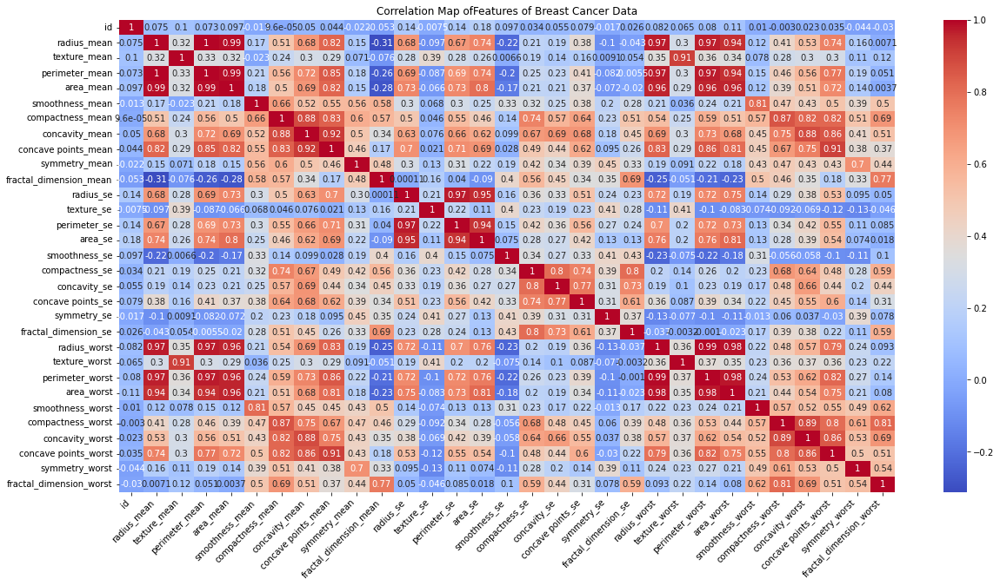

In [9]:
corr = data.corr()
correlation_heatmap(corr,"Features of Breast Cancer Data")

### As we can see above the features area and perimeter highly correlate to radius. Also there is a high correlation between compactness and perimeter. 

<AxesSubplot:xlabel='diagnosis', ylabel='Count'>

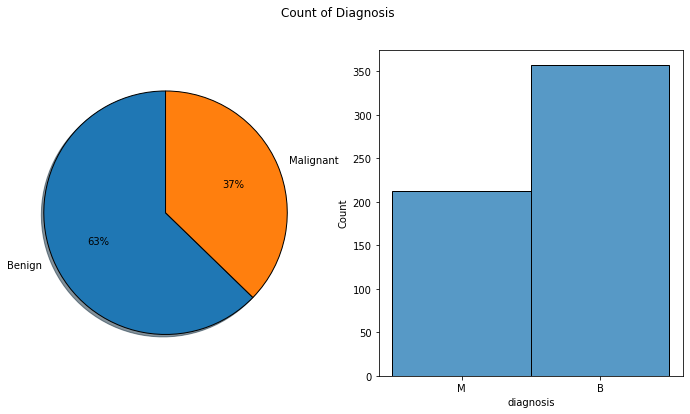

In [10]:
import seaborn as sn
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle('Count of Diagnosis')

diag = data.groupby("diagnosis")
axes[0].pie(diag.count()["id"],labels=["Benign","Malignant"], startangle=90, wedgeprops={'edgecolor': 'black'}, autopct='%1.f%%',  shadow=True)
sn.histplot(data=data,x="diagnosis",ax=axes[1])


/home/dibora/Casualty/casuality/lib/python3.7/site-packages/seaborn/categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 864x504 with 0 Axes>

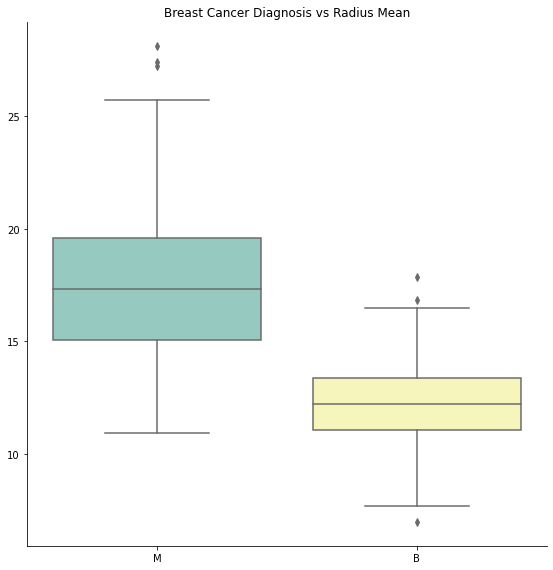

In [11]:
catplot(data,x="diagnosis",y="radius_mean",kind="box",title="Breast Cancer Diagnosis vs Radius Mean",size=8)

Correlation between features


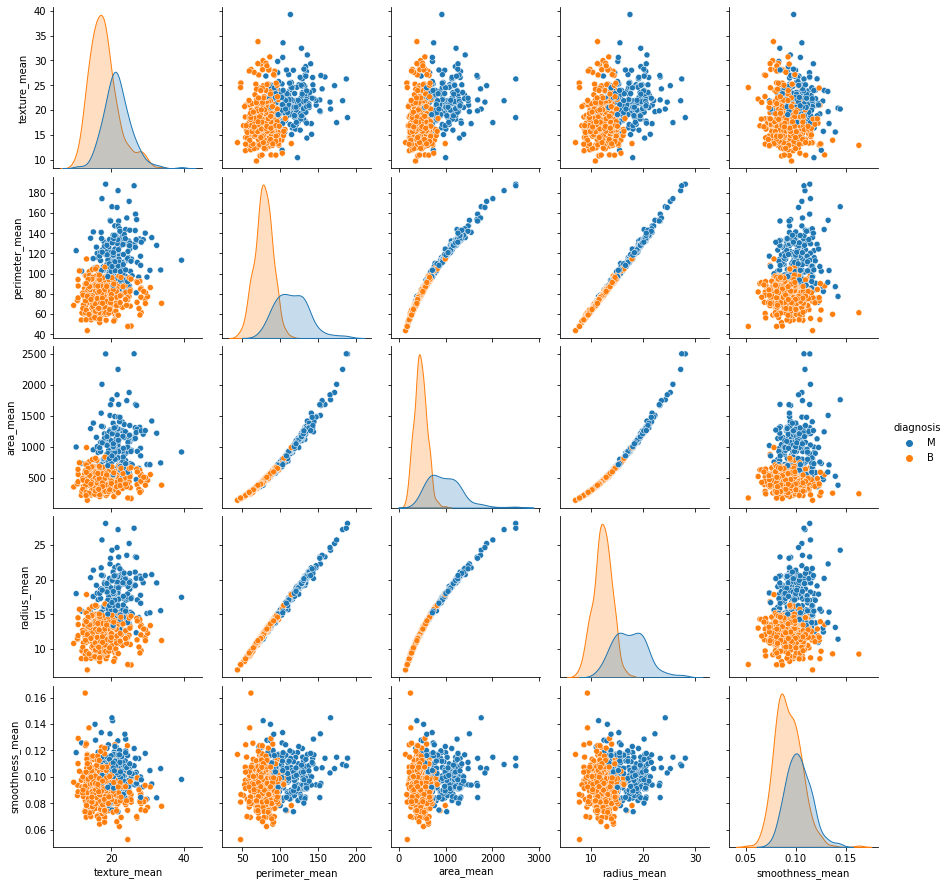

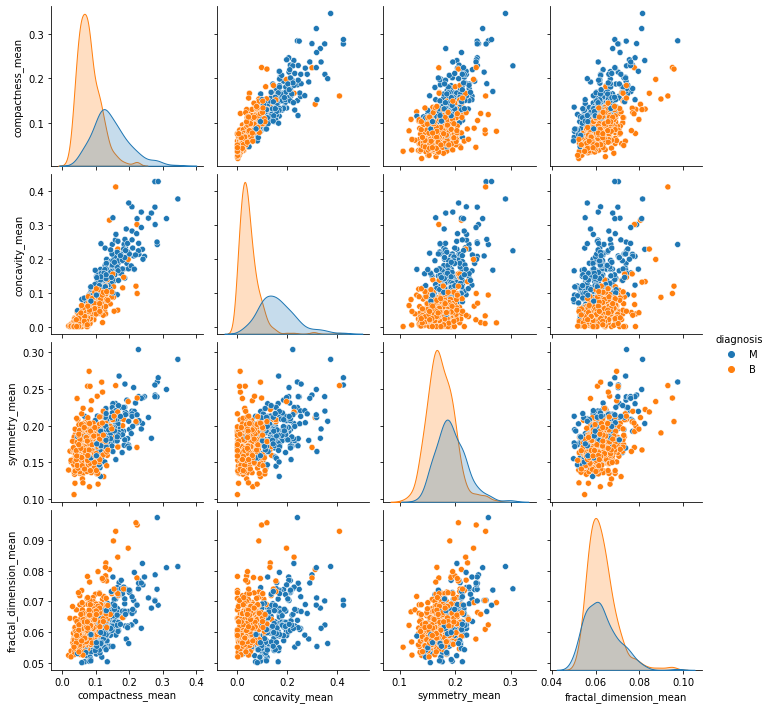

In [12]:
print("Correlation between features")
sn.pairplot(data,vars=["texture_mean", "perimeter_mean","area_mean","radius_mean",'smoothness_mean'],hue="diagnosis")
sn.pairplot(data,vars=['compactness_mean','concavity_mean', 'symmetry_mean', 'fractal_dimension_mean'],hue="diagnosis")


## high correlating features with radius_mean

In [13]:
from scipy.stats import spearmanr
print('Features with high Spearmans correlation value with radius_mean')
for column in data.columns.tolist():
    corr, _ = spearmanr(data["radius_mean"], data[column])
    if corr > 0.7:
        print(column,corr)
    

Features with high Spearmans correlation value with radius_mean
diagnosis 0.7327849896210553
radius_mean 0.9999999999999998
perimeter_mean 0.9978017394617466
area_mean 0.9996020278067481
concave points_mean 0.7597023617521341
area_se 0.7380771768917995
radius_worst 0.9786044231727474
perimeter_worst 0.9715554621458756
area_worst 0.9788626109712246
concave points_worst 0.7272651798851105


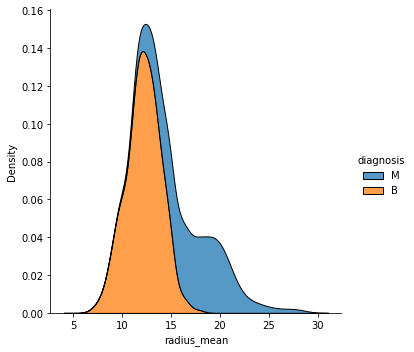

In [14]:
sn.displot(data=data, x="radius_mean",kind="kde", hue="diagnosis", multiple="stack")

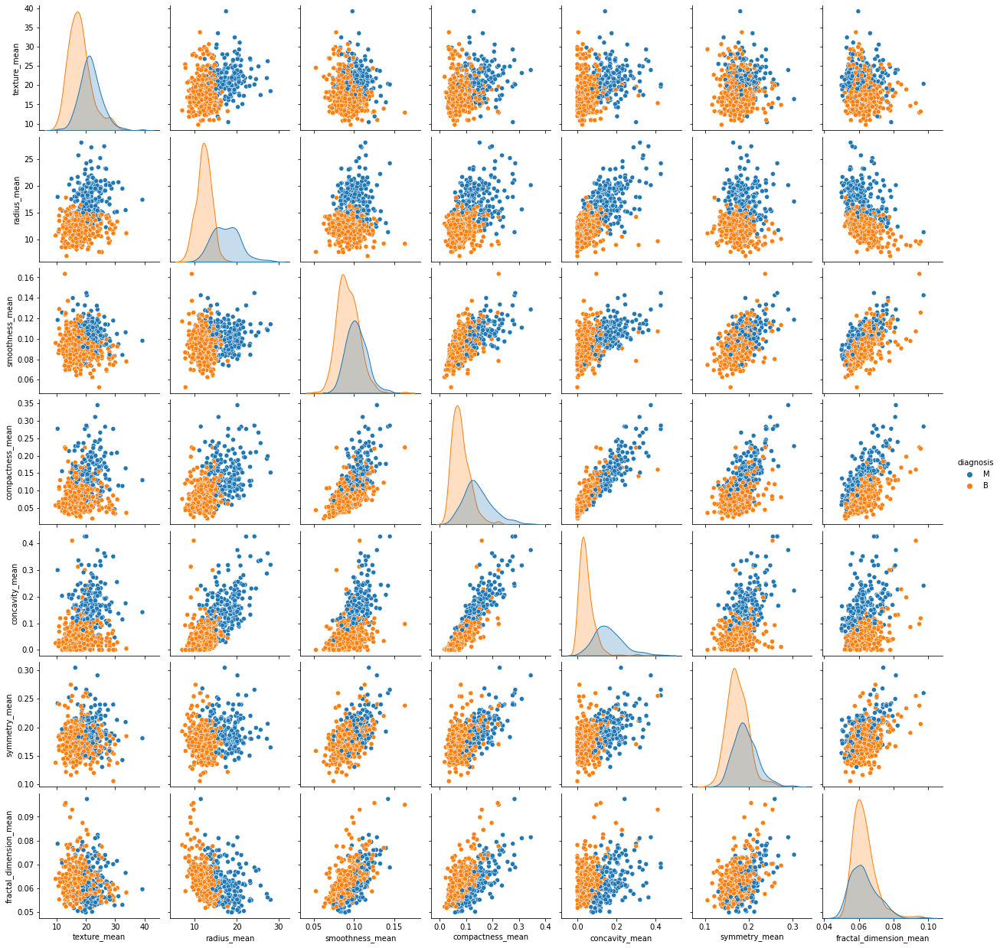

In [15]:
sn.pairplot(data,vars=["texture_mean","radius_mean",'smoothness_mean','compactness_mean','concavity_mean', 'symmetry_mean', 'fractal_dimension_mean'],hue="diagnosis")


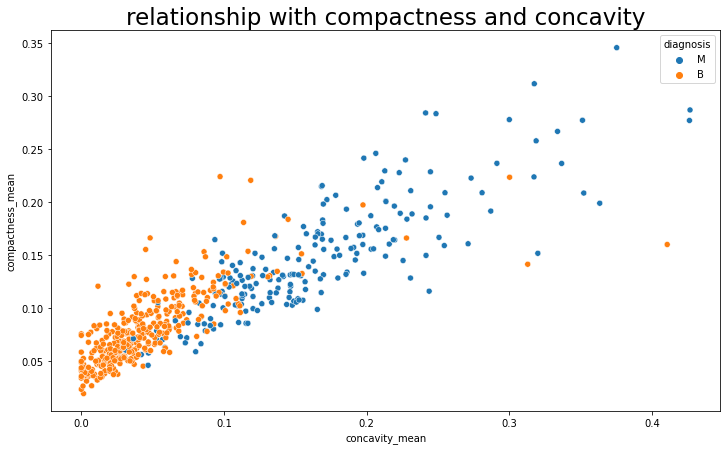

Spearman score of compactness with concavity 0.8965184184416177


In [16]:
scatterplot(data, x="concavity_mean",y="compactness_mean", hue="diagnosis",title="relationship with compactness and concavity")
corr, _ = spearmanr(data["compactness_mean"], data["concavity_mean"])
print("Spearman score of compactness with concavity",corr)

In [17]:
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [19]:
y= encode([[val]for val in data["diagnosis"]])
data_x = data.drop(columns=["id","diagnosis"])
X = np.array(data_x)
y = y.reshape(-1,)



In [20]:
X_train, X_test, y_train, y_test = prepare_X_y(X,y)

In [21]:
X_train.shape,y_train.shape

((426, 30), (426,))

In [22]:
importances, std = calculate_feature_importance(X_train,y_train,X)

In [23]:
importances.shape

(30,)

,features,feature_importance
0,radius_mean,0.038347
1,texture_mean,0.016274
2,perimeter_mean,0.060833
3,area_mean,0.054680
4,smoothness_mean,0.007058
5,compactness_mean,0.005051
6,concavity_mean,0.055708
7,concave points_mean,0.088967
8,symmetry_mean,0.004268
9,fractal_dimension_mean,0.003079


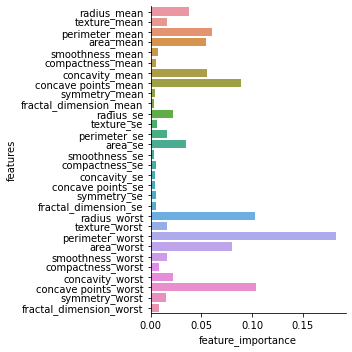

In [24]:


feature_df = pd.DataFrame({"features":data_x.columns,"feature_importance": importances})
g=sn.catplot(data=feature_df,y="features",x="feature_importance",kind="bar")
feature_df

### We can choose the features manually

,features,feature_importance
0,radius_mean,0.038347
2,perimeter_mean,0.060833
3,area_mean,0.054680
6,concavity_mean,0.055708
7,concave points_mean,0.088967
13,area_se,0.035351
20,radius_worst,0.103212
22,perimeter_worst,0.183059
23,area_worst,0.080741
27,concave points_worst,0.103635


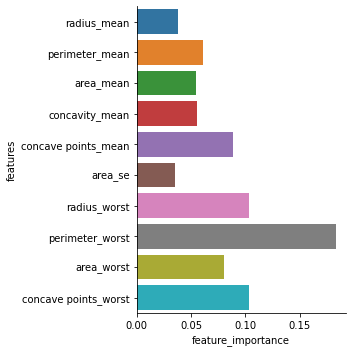

In [25]:
selected_features = feature_df.query('feature_importance > 0.03')
g=sn.catplot(data=selected_features,y="features",x="feature_importance",kind="bar")
selected_features

/home/dibora/Casualty/casuality/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


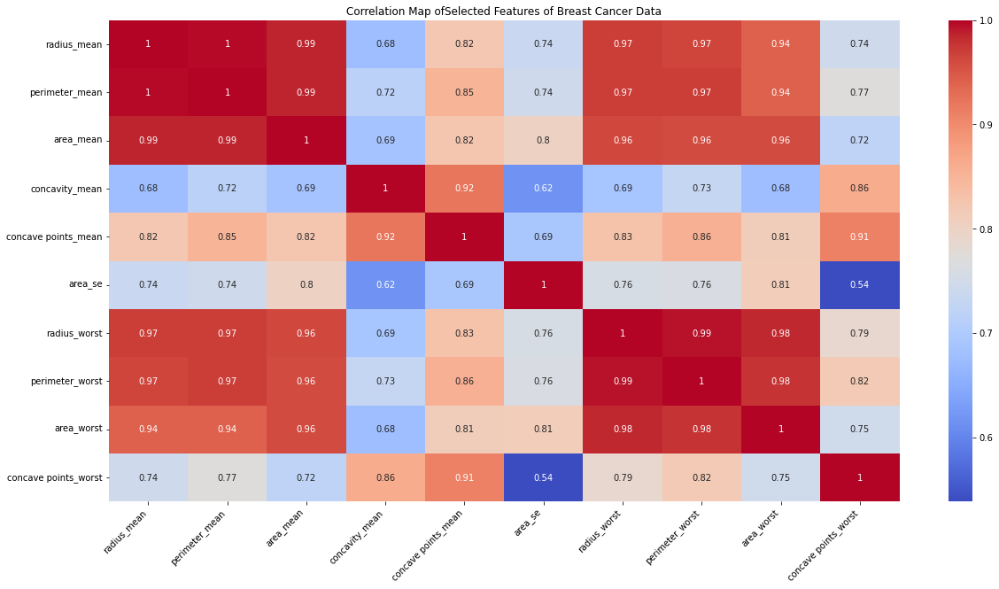

In [26]:
data_selected = data[selected_features['features']]
data_selected['diagnosis'] = data['diagnosis']
corr_selected = data_selected.corr()
correlation_heatmap(corr_selected,"Selected Features of Breast Cancer Data")

### Instead of using manual selection we will use Meta-transformer for selecting features based on importance weights.

In [29]:
features = select_features(X_train,y_train,data_x)


In [30]:
data_selected = data[selected_features['features']]
data_selected['diagnosis'] = encode(data['diagnosis'])

/home/dibora/Casualty/casuality/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [31]:
data_selected.head()

,radius_mean,perimeter_mean,area_mean,concavity_mean,concave points_mean,area_se,radius_worst,perimeter_worst,area_worst,concave points_worst,diagnosis
0,17.99,122.80,1001.0,0.3001,0.14710,153.40,25.38,184.60,2019.0,0.2654,1
1,20.57,132.90,1326.0,0.0869,0.07017,74.08,24.99,158.80,1956.0,0.1860,1
2,19.69,130.00,1203.0,0.1974,0.12790,94.03,23.57,152.50,1709.0,0.2430,1
3,11.42,77.58,386.1,0.2414,0.10520,27.23,14.91,98.87,567.7,0.2575,1
4,20.29,135.10,1297.0,0.1980,0.10430,94.44,22.54,152.20,1575.0,0.1625,1


In [32]:
data_selected.to_csv('../data/data.csv')